In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import numpy as np
from tensorflow import keras
from keras.layers import Input, Lambda, Dense, Flatten, Rescaling
from keras.models import Model
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import auc
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import RocCurveDisplay
from os import listdir, path
from skimage.util import random_noise
from skimage import img_as_float
import math
import cv2
import os
import PIL
import shutil
import matplotlib.cm as cm

# Cats VS Dogs
**Binary Classification**
For the task of binary classifiaction Xception pretrained model is used. We will be removing the output layer and putting our own classifier for the model. Inoreder to benefit from the weights of the Xception model we wiil be Freezing the base mdoel and traning the added layers. Then we will FINE Tune the model by unfreezing the base model and train the whole network on a very small learning rate so that the weights get adapted to the new dataset but also not get drastically changed. The fine tuned model will be proving us some better results.

The Huggingface space link: https://huggingface.co/spaces/OmerFarooq/Cats-vs-Dogs

# Importing Dependencis

# Functions

In [ ]:

#function for creating models
def create_model(classes, activation):
  inputs = keras.Input(shape = (160,160,3))
  #normalizing pixel values
  x = Rescaling(scale = 1./255)(inputs)
  x = base_model(x, training = False)
  x = keras.layers.GlobalAveragePooling2D()(x)
  outputs = keras.layers.Dense(classes,activation = activation)(x)
  model = keras.Model(inputs, outputs)

  if activation == "linear":
    loss_s = keras.losses.BinaryCrossentropy(from_logits = True)
  else:
    loss_s = keras.losses.BinaryCrossentropy()

  model.compile(
      loss = loss_s,
      optimizer = keras.optimizers.Adam(0.001),
      metrics = ["accuracy"]
  )

  return model

In [ ]:

#creating callbacks for early stopping if the validation loss does not decrease more than 0.5 on a epoch
callback1 = tf.keras.callbacks.EarlyStopping(monitor='loss', min_delta = 0.05, patience = 4, mode = 'min', baseline = 0.1, start_from_epoch = 2)

#creating callbacks for reducing the learning rate once the parameters are met
callback2 = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_loss', factor = 0.1, patience = 1, mode = 'min', min_lr = 0.000001, )

def dynamic_rate(epoch):
  if epoch > 5:
    return 0.00001
  else:
    return 0.0001

callback3 = tf.keras.callbacks.LearningRateScheduler(dynamic_rate)

In [ ]:
#Plot the loss and accuracy curves for training and validation
def acc_loss_plot(m, size = [15,5],los_limit = [0,1], acc_limit = None):
  fig, ax = plt.subplots(1,2, figsize=(size[0],size[1]))
  fig.tight_layout(pad=3)
  ax[0].plot(m.history['loss'], color='b', label="Training loss")
  ax[0].plot(m.history['val_loss'], color='r', label="validation loss",axes =ax[0])
  ax[0].set_ylim([0, 1])
  ax[0].legend()
  ax[0].set_title('Loss plot')
  ax[0].set_xlabel('epochs')
  ax[0].set_ylabel('Loss')

  ax[1].plot(m.history['accuracy'], color='b', label="Training accuracy")
  ax[1].plot(m.history['val_accuracy'], color='r',label="Validation accuracy")
  # ax[1].set_ylim([0, 1])
  if acc_limit != None:
    ax[1].set_ylim(acc_limit)
  ax[1].legend()
  ax[1].set_title('Accuracy plot')
  ax[1].set_xlabel('epochs')
  ax[1].set_ylabel('accuracy')


In [ ]:
#making predictions on provided dataset
def pred(model, cv_ds):
  y_pred = model_linear.predict(cv_ds)
  for i in range(len(y_pred)):
      if y_pred[i] > 0.5: y_pred[i] = 1
      else: y_pred[i] = 0
  return y_pred

In [ ]:
#plotting confusion matrix for the provided model
def confusion_plot(model, y_pred, cv_ds, labels_cv):
  confusion_mtrx_l = confusion_matrix(labels_cv, y_pred)
  matrix = ConfusionMatrixDisplay(confusion_mtrx_l)
  matrix.plot()
  plt.show()
  print("Total: ", confusion_mtrx_l.sum())
  return confusion_mtrx_l


In [ ]:
#calculates precision and recall
def precision_recall(labels_true, labels_pred):
  precision = precision_score(labels_true, labels_pred, average = None)
  recall = recall_score(labels_true, labels_pred, average = None)
  print("Precision: ", precision)
  print("Recall: ", recall)
  return precision, recall

In [ ]:
#calculates auc and plots the roc_curve
def roc_plot(labels_true, labels_pred):
  roc_l = roc_auc_score(labels_true, labels_pred)
  print("Area under the curve: ", roc_l)

  fpr, tpr, thresholds = roc_curve(labels_true, labels_pred)
  roc_auc = auc(fpr, tpr)
  roc = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
  roc.plot()
  plt.show()
  return roc_l

In [ ]:
def reset_folders(paths):
  for i in paths:
    try:
      shutil.rmtree(i)
    except FileNotFoundError:
      print("Path does not exists: " + i)
      continue

In [ ]:
#function for displaying given array of images with their true labels and pred labels
def show_imgs(imgs, labels_t, size, cols, labels_f = None, font_size = 10):
  plt.figure(figsize = (size[0],size[1]))

  for i in range(len(imgs)):
    plt.subplot(math.ceil(len(imgs)/5),cols,i+1)
    plt.imshow(imgs[i])
    if labels_f is None:
      plt.title("True Label: " + str(labels_t[i]), fontsize = font_size)
    else:
      plt.title("True Label: " + str(labels_t[i]) + "\n" + "Pred Label: " + str(labels_f[i]), fontsize = font_size)
    plt.axis('off')

In [ ]:
#function that find the misclassified images in the given dataset by the given model
#returns indexes of images that are misclassified by the model, the predicted values and also the correctly classified images
def cal_mis(model, cv_ds, labels_cv):
  y_pred = model_linear.predict(cv_ds)
  for i in range(len(y_pred)):
      if y_pred[i] > 0.5: y_pred[i] = 1
      else: y_pred[i] = 0

  mis = []
  crt = []
  for i in range(len(labels_cv)):
    if y_pred[i] != labels_cv[i]:
      mis.append(i)
    else:
      crt.append(i)

  print("Total misclassified: ", len(mis), "\n")
  return mis, crt, y_pred

In [ ]:
#function shows images that are misclassified in the provided dataset
def show_mis(mis, y_pred, cv_ds, labels_cv, size, cols):
  plt.figure(figsize = (size[0],size[1]))

  for i in range(len(mis)):
    plt.subplot(math.ceil(len(mis)/5),cols,i+1)
    plt.imshow(cv_ds[mis[i]])
    plt.title("True Label: " + str(labels_cv[mis[i]]) + "\n" + "Pred Label: " + str(y_pred[mis[i]]), fontsize = 10)
    plt.axis('off')

In [ ]:
#function for saving misclassified images
#paras = indeces, images, path
def save_mis(mis, cv_ds, path):
  for i in range(len(mis)):
    img = PIL.Image.fromarray(cv_ds[mis[i]].astype('uint8'), "RGB")
    name = "/img_" + str(mis[i]) + ".jpeg"
    img.save((path + name))

In [ ]:
#for adding the given noise to the given dataset
#img array must be float not int
def add_noise(cv_ds, mode, amount = None):
  cv_noise = []
  for i in cv_ds:
    if amount == None:
      img = random_noise(i/255.0, mode = mode)
    else:
      img = random_noise(i/255.0, mode = mode, amount = amount)
    cv_noise.append(np.array(img*255).astype('uint8'))
  print("Applying " + mode + " Noise")
  cv_noise = np.array(cv_noise)
  print("-- "+mode+" noise added --")
  return cv_noise

In [ ]:
#finds which images are correctly classified which were previously misclassified, after adding noise
#works by finding index of original misclassified images in the misclassified images after adding noise, if not found means correctly classified after adding noise
#returns the indeces of cca images
def cca_improve(prev, after):
  comp = []
  for i in prev:
    try:
      after.index(i)
    except ValueError:
      comp.append(i)
      # print(str(i) + " correctly classified")
  return comp

In [ ]:
#finds images that are misclassified which were previously correctly classified, after adding noise
#works by finding index of original correctly classified images in the misclassified noisy images, if found means now that image is misclassified
#returns the indeces of cca images
def mca_reduce(crt, mis_noise):
  print("After adding noise:")
  comp = []
  for i in crt:
    try:
      mis_noise.index(i)
      comp.append(i)
      # print(str(i) + " misclassified")
    except ValueError:
      continue
  return comp

In [ ]:
#finds images that are correclty classified after and even before adding noise
#works by finding index of original correctly classified images in the correctly classified noisy images, if found means that image is again correctly classified
#returns the indeces of ccba images
def ccba_f(crt, crt_noise):
  comp = []
  for i in crt:
    try:
      crt_noise.index(i)
      comp.append(i)
      # print(str(i) + " correctly classified")
    except ValueError:
      continue
  return comp

In [ ]:
#finds images that are misclassified after and even before adding noise
#works by finding index of original misclassified images in the misclassified noisy images, if found means that image is again misclassified
#returns the indeces of ccba images
def mcba_f(mis, mis_noise):
  comp = []
  for i in mis:
    try:
      mis_noise.index(i)
      comp.append(i)
      # print(str(i) + " again misclassified")
    except ValueError:
      continue
  return comp

In [ ]:
def store_imgs(cv_noise, mcba, mca, ccba, cca, path):
  #making  folder to store the misclassified noise images of model_linear
  folder = ["/mcba", "/mca", "/ccba", "/cca"]
  for i in folder:
    if i == "/mcba":
      save_mis(mcba, cv_noise, (path+i))
    elif i == "/mca":
      save_mis(mca, cv_noise, (path+i))
    elif i == "/ccba":
      save_mis(ccba, cv_noise, (path+i))
    elif i == "/cca":
      save_mis(cca, cv_noise, (path+i))

In [ ]:
#function for opening and resizing img
def img_pros(path):
    img = open(path,'rb')
    img = img.read()
    img = tf.image.decode_jpeg(img)
    img =tf.image.resize(img, [160,160])
    img = tf.expand_dims(img, axis = 0)
    return img

In [ ]:
#fucntion to process, predict and plot images
def img_pred(path_imgs, model, sub_plot, fig_size):
  img_p = []
  preds = []
  for i in path_imgs:
    img_p.append(img_pros(i))
    preds.append(model.predict(img_p[-1], verbose = 0))

  fig, ax = plt.subplots(sub_plot[0],sub_plot[1], figsize=(fig_size[0],fig_size[1]))
  fig.tight_layout(pad=0.1)

  for i,ax in enumerate(ax.flat):
      ax.imshow(np.array(img_p[i][0]).astype('uint8'))

      # Display the label above the image
      ax.set_title(preds[i][0][0], fontsize= 10)
      ax.set_axis_off()
      # print(preds)

In [ ]:
#for creating models to be trained on different distributions of train dataset
#return models array containing all the models created and historys array containing the history of all models
def model_on_train(train_ds, labels_train, cv_ds, labels_cv, verbose = 0):
  models = []
  historys = []
  distributions = []

  m8 = create_model(1, "linear")
  m8_m = m8.fit(np.concatenate((train_ds, cv_ds[:200]), axis=0),
                np.concatenate((labels_train, labels_cv[:200]), axis=0),
                validation_data = (cv_ds[200:], labels_cv[200:]),
                epochs = 10, batch_size = 64, callbacks = callback2, verbose = verbose)

  m7 = create_model(1, "linear")
  m7_m = m7.fit(np.concatenate((train_ds, cv_ds[:100]), axis=0),
                np.concatenate((labels_train, labels_cv[:100]), axis=0),
                validation_data = (cv_ds[200:], labels_cv[200:]),
                epochs = 10, batch_size = 64, callbacks = callback2, verbose = verbose)

  m6 = create_model(1, "linear")
  m6_m = m6.fit(train_ds, labels_train, validation_data = (cv_ds[200:], labels_cv[200:]),
                epochs = 10, batch_size = 64, callbacks = callback2, verbose = verbose)

  m5 = create_model(1, "linear")
  m5_m = m5.fit(train_ds[:500], labels_train[:500],
                validation_data = (cv_ds[200:], labels_cv[200:]),
                epochs = 10, batch_size = 64, callbacks = callback2, verbose = verbose)

  m4 = create_model(1, "linear")
  m4_m = m4.fit(train_ds[:400], labels_train[:400],
                validation_data = (cv_ds[200:], labels_cv[200:]),
                epochs = 10, batch_size = 64, callbacks = callback2, verbose = verbose)

  m3 = create_model(1, "linear")
  m3_m = m3.fit(train_ds[:300], labels_train[:300],
                validation_data = (cv_ds[200:], labels_cv[200:]),
                epochs = 10, batch_size = 64, callbacks = callback2, verbose = verbose)

  m2 = create_model(1, "linear")
  m2_m = m2.fit(train_ds[:200], labels_train[:200],
                validation_data = (cv_ds[200:], labels_cv[200:]),
                epochs = 10, batch_size = 64, callbacks = callback2, verbose = verbose)

  m1 = create_model(1, "linear")
  m1_m = m1.fit(train_ds[:100], labels_train[:100],
                validation_data = (cv_ds[200:], labels_cv[200:]),
                epochs = 10, batch_size = 64, callbacks = callback2, verbose = verbose)

  models = [m8, m7, m6, m5, m4, m3, m2, m1]
  historys = [m8_m, m7_m, m6_m, m5_m, m4_m, m3_m, m2_m, m1_m]

  return models, historys

In [ ]:
#print the loss, accuracy, val_loss and val_accuracy of every model train on its own train set distribution
def print_train_results(historys):
  for i in range(len(historys)):
    print("m_" + str(len(historys)-i) + ":", end = "["+"train: " + str((len(historys)-i)*100)+"] ")
    # print("train: " + str((len(historys)-i)*100))
    print("    loss: " + str(round(historys[i].history['loss'][-1], 3)), end = " - ")
    print("accuracy: " + str(round(historys[i].history['accuracy'][-1], 3)), end = " - ")
    print("val_loss: " + str(round(historys[i].history['val_loss'][-1], 3)), end = " - ")
    print("val_accuracy: " + str(round(historys[i].history['val_accuracy'][-1], 3)))
    # print()

In [ ]:
#finds the accuracy of every model in the given array on the test set and also prints the test_loss and test_accuracy
#returns array of test results of each model
def model_on_test(models, test_ds, labels_test, verbose = 0):
  test_results = []
  for i in range(len(models)):
    print("m_" + str(len(models)-i) + ":", end = " ")
    test_results.append(models[i].evaluate(test_ds, labels_test, verbose = verbose))
    test_results[i] = [round(i, 3) for i in test_results[i]]
    print(test_results[i])
  return test_results

In [ ]:
#function to apply Adaptive Histogram Equilization
#image converted to hsv colorspace, ahe applied on v channel, all channels merged again, converted back to RGB color space
def apply_ahe(dataset):
  ds = []
  clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(3, 3))
  for i in dataset:
    hsv = cv2.cvtColor(i.astype('uint8'), cv2.COLOR_BGR2HSV)
    h,s,v = cv2.split(hsv)
    v = clahe.apply(v)
    img = cv2.merge((h, s, v))
    img = cv2.cvtColor(img, cv2.COLOR_HSV2BGR)
    ds.append(img)
  return np.array(ds).astype('uint8')

In [ ]:
#function for creating model
#returns model, its inputs, Xception's last conv output, the whole model's outputs
def create_model_mod(classes, activation):
  inputs = keras.Input(shape = (160,160,3))
  #normalizing pixel values
  r = Rescaling(scale = 1./255)(inputs)
  x = base_model(r, training = False)
  gap = keras.layers.GlobalAveragePooling2D()(x)
  outputs = keras.layers.Dense(classes ,activation = activation)(gap)
  model = keras.Model(inputs, outputs)

  if activation == "linear":
    loss_s = keras.losses.BinaryCrossentropy(from_logits = True)
  else:
    loss_s = keras.losses.BinaryCrossentropy()

  model.compile(
    loss = loss_s,
    optimizer = keras.optimizers.Adam(0.001),
    metrics = ["accuracy"]
  )

  return model, inputs, x, outputs

In [ ]:
#function for creating model
#returns model, its inputs, Xception's last conv output, the whole model's outputs
def create_model_mod_base(classes, activation, base):
  inputs = keras.Input(shape = (160,160,3))
  #normalizing pixel values
  r = Rescaling(scale = 1./255)(inputs)
  x = base(r, training = False)
  gap = keras.layers.GlobalAveragePooling2D()(x)
  outputs = keras.layers.Dense(classes ,activation = activation)(gap)
  model = keras.Model(inputs, outputs)

  if activation == "linear":
    loss_s = keras.losses.BinaryCrossentropy(from_logits = True)
  else:
    loss_s = keras.losses.BinaryCrossentropy()

  model.compile(
    loss = loss_s,
    optimizer = keras.optimizers.Adam(0.001),
    metrics = ["accuracy"]
  )

  return model, inputs, x, outputs

In [ ]:
#function that creates a gradcam model with specifiedd base model and returns it
def create_grad_model_base(weights, classes, activation, base):
  model_mod, input, x, output = create_model_mod_base(classes, activation, base)
  #lodaing weights of already trained model
  model_mod.load_weights(weights)
  grad_model = Model(input, [x, output])
  return grad_model

In [ ]:
#create heatmaps of the given images
#returns the heatmaps and the raw score of predicted class of each image
def create_heatmap(model, imgs, class_index):
  model.layers[-1].activation = None

  #predicting the images and getting the conv outputs and predictions from the gradcam model
  with tf.GradientTape() as tape:
    maps, preds = model(imgs);
    class_channel = preds[:, class_index]

  #computing gradients of predictions w.r.t the feature maps
  if class_index == -1:
    grads = tape.gradient(preds, maps)
  else:
    grads = tape.gradient(class_channel, maps)

  # global average pooling of each feature map
  gap_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

  #multiplying each pooled value with its correponding feature map
  # maps = maps[0]
  heatmap = maps @ gap_grads[..., tf.newaxis]

  #removing the extra dimension of value 1
  heatmap = tf.squeeze(heatmap)

  # #applying relu activation
  # heatmap = tf.keras.activations.relu(heatmap)

  # For visualization purpose, we will normalize the heatmap between 0 & 1
  heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)

  return heatmap, preds.numpy()


In [ ]:
#function for superimposing the heatmaps with their repective images
def superimpose(heatmap, imgs, alpha = 0.4):
  # Rescale heatmap to a range 0-255
  heatmap = np.uint8(255 * heatmap)
  final_imgs = []

  # Use jet colormap to colorize heatmap
  jet = cm.get_cmap("jet")

  # Use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]

  for i in range(len(heatmap)):
    jet_heatmap = jet_colors[heatmap[i]]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((160,160)) #can be given original dimensions of image to rescale the heatmap to the size of the image
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + imgs[i]
    # superimposed_img = keras.utils.array_to_img(superimposed_img)
    final_imgs.append(superimposed_img.astype('uint8'))

  return np.array(final_imgs)


In [ ]:
#helper function that generates heatmaps and then combine them with their images
def gen_grad_imgs(grad_model, imgs, class_index, alpha = 0.4):
  heatmaps, y_pred = create_heatmap(grad_model, imgs, class_index)

  # if classes == 1:
  #   for i in range(len(y_pred)):
  #       if y_pred[i] > 0.5: y_pred[i] = 1
  #       else: y_pred[i] = 0

  imgs = superimpose(heatmaps, imgs, alpha)
  return imgs, y_pred

In [ ]:
#superimpose function buth for a single input image
def superimpose_single(heatmap, img, alpha = 0.4):
  heatmap = np.uint8(255 * heatmap)

  # Use jet colormap to colorize heatmap
  jet = cm.get_cmap("jet")

  # Use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[heatmap]

  # Create an image with RGB colorized heatmap
  jet_heatmap = keras.utils.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((160,160))
  jet_heatmap = keras.utils.img_to_array(jet_heatmap)

  # Superimpose the heatmap on original image
  superimposed_img = jet_heatmap * alpha + img
  # superimposed_img = keras.utils.array_to_img(superimposed_img)

  return superimposed_img

In [ ]:
#for generating single gradcam image
def gen_grad_img_single(grad_model, img, class_index, alpha = 0.4):
  heatmaps, y_pred = create_heatmap(grad_model, img, class_index)

  # for i in range(len(y_pred)):
  #     if y_pred[i] > 0.5: y_pred[i] = 1
  #     else: y_pred[i] = 0

  img = superimpose_single(heatmaps, img[0])
  return np.array(img).astype('uint8'), y_pred

In [ ]:
def gen_grad_both(grad_model, imgs, y_true, size, cols, font_size):
  if len(imgs) == 1:
    img_c, y_pred_c = gen_grad_img_single(grad_model, imgs, 0)
    img_d, y_pred_d = gen_grad_img_single(grad_model, imgs, 1)
    y_pred_c = np.around(y_pred_c,3)
    y_pred_d = np.around(y_pred_d,3)
    show_imgs([img_c, img_d], [y_true, y_true], [size[0], size[1]], cols, [y_pred_c, y_pred_d], font_size = font_size)
  else:
    img_c, y_pred_c = gen_grad_imgs(grad_model, imgs, 0)
    img_d, y_pred_d = gen_grad_imgs(grad_model, imgs, 1)
    y_pred_c = np.around(y_pred_c,3)
    y_pred_d = np.around(y_pred_d,3)
    show_imgs(np.concatenate((img_c, img_d), axis = 0), np.concatenate((y_true, y_true), axis = 0), [size[0], size[1]], cols, np.concatenate((y_pred_c, y_pred_d),axis = 0), font_size = font_size)

  print()
  print("==> First image w.r.t CAT")
  print("==> Second image w.r.t DOG")
  print()

tf.Tensor(
[[0.33286116 0.41461596 0.5087482  0.47378737 0.34699357]
 [0.57895    0.8138094  0.92797697 0.8465432  0.5574242 ]
 [0.5474355  0.8125835  1.         0.94702274 0.63309443]
 [0.42008415 0.67206085 0.8817816  0.8071535  0.54052657]
 [0.19732828 0.31546554 0.47991857 0.4349469  0.32938576]], shape=(5, 5), dtype=float32)
<dtype: 'float32'>
(5, 5)


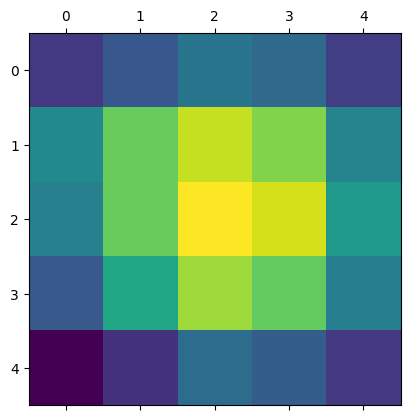

In [ ]:
weights = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/model_weights/weights_nm.h5"
grad_model = create_grad_model(weights, 2, "softmax")
heatmap, y_pred = create_heatmap(grad_model, tf.expand_dims(cv_ds[2],axis = 0), 0)
print(heatmap)
print(heatmap.dtype)
print(heatmap.shape)
plt.matshow(heatmap)

In [ ]:
img = superimpose_single(heatmap, cv_ds[2], alpha = 0.4)
# print(img.dtype)

<ipython-input-74-88d543984486>:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


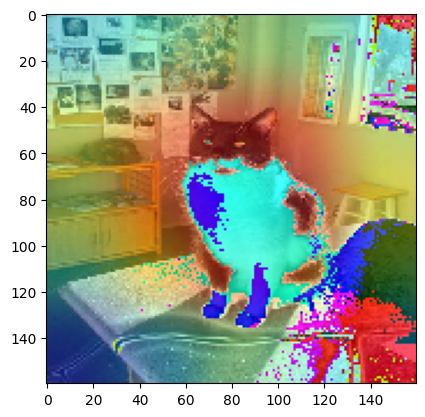

In [ ]:
plt.imshow(np.array(img).astype('uint8'))

# Loading Data

* train_ds contains 600 examples
* test_ds contains 300 examples
* cv_ds contains 300 examples

In [ ]:
#loading data
train_ds = np.load("/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/images_train.npy")
test_ds = np.load("/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/images_test.npy")
cv_ds = np.load("/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/images_valid.npy")

labels_train = np.load("/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/labels_train.npy")
labels_test = np.load("/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/labels_test.npy")
labels_cv = np.load("/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/labels_valid.npy")

In [ ]:
print("Examples: ")
print("Train", train_ds.shape)
print("Test", test_ds.shape)
print("Cross_validation", cv_ds.shape)

print()
print("Labels: ")
print(labels_train.shape)
print(labels_test.shape)
print(labels_cv.shape)


Examples: 
Train (600, 160, 160, 3)
Test (300, 160, 160, 3)
Cross_validation (300, 160, 160, 3)

Labels: 
(600,)
(300,)
(300,)


In [ ]:
# #display images
# fig, axes = plt.subplots(3,3, figsize=(5,5))
# fig.tight_layout(pad=0.1)

# for i,ax in enumerate(axes.flat):
#     ax.imshow(train_ds[i])

#     # Display the label above the image
#     ax.set_title(labels_train[i])
#     ax.set_axis_off()

In [ ]:
# print("In train")
# print("Cats: ", np.count_nonzero(labels_train))
# print("Dogs: ", np.count_nonzero(labels_train == 0))

# Configuring Base Model
- Xception has been used as a base model for transfer learning whicg is trained on imagenet dataset<br>
- weights of teh model has been loaded from the file "../input/xception/xception_weights_tf_dim_ordering_tf_kernels_notop.h5"
- the input shape has been restricted to 160 by 160 by 3 vector
- In order to benefit from the weifghts of the Xception model, we will remove the top layer(output layer) and attach our own classifier later
- the remainig base model has been freezed(i.e. setting it to not to be trained causing its weights not to be changed)

In [ ]:
base_model = keras.applications.Xception(
    # weights = "../input/xception/xception_weights_tf_dim_ordering_tf_kernels_notop.h5",
    input_shape = (160,160,3),
    include_top = False,)

base_model.trainable = False

83683744/83683744 [==============================] - 1s 0us/step


# Binary Classifier

For our Binary classifiaction of Cats and Dogs we will be making a Network containing the base model including:
- Input Layer which accepts the vector images of shapes 160x160x3
- Rescaling Layer which normalizes the pixel values(0-255) to values between -1 and 1
- The base Model(Xception) set to untrainable
- GlobalAveragePooling2D computes the average value of all values across the entire matrix
- Dense layer with 'linear' activation for binary clasifiaction<br>
<br>
The model as been compiled using Binar crossentropy and Adam optimizer

In [ ]:
#seeting seed for uniform randomization
tf.random.set_seed(1234)

In [ ]:
model_linear = create_model(1, "linear")
model_linear.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 160, 160, 3)       0         
                                                                 
 xception (Functional)       (None, 5, 5, 2048)        20861480  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 1)                 2049      
                                                                 
Total params: 20,863,529
Trainable params: 2,049
Non-trainable params: 20,861,480
_____________________________________________

# Traing the Model
The model is now trained on the train_ds data set containg 600 training examples

In [ ]:
#training linear model
m = model_linear.fit(train_ds, labels_train, validation_data = (cv_ds, labels_cv), epochs = 10, batch_size = 64, callbacks = callback2)

Epoch 1/10
10/10 [==============================] - 17s 493ms/step - loss: 0.5730 - accuracy: 0.6500 - val_loss: 0.3258 - val_accuracy: 0.8633 - lr: 0.0010
Epoch 2/10
10/10 [==============================] - 2s 191ms/step - loss: 0.2437 - accuracy: 0.9333 - val_loss: 0.1839 - val_accuracy: 0.9333 - lr: 0.0010
Epoch 3/10
10/10 [==============================] - 2s 193ms/step - loss: 0.1556 - accuracy: 0.9450 - val_loss: 0.1392 - val_accuracy: 0.9433 - lr: 0.0010
Epoch 4/10
10/10 [==============================] - 2s 199ms/step - loss: 0.1243 - accuracy: 0.9483 - val_loss: 0.1213 - val_accuracy: 0.9433 - lr: 0.0010
Epoch 5/10
10/10 [==============================] - 2s 191ms/step - loss: 0.1075 - accuracy: 0.9567 - val_loss: 0.1133 - val_accuracy: 0.9500 - lr: 0.0010
Epoch 6/10
10/10 [==============================] - 2s 193ms/step - loss: 0.0970 - accuracy: 0.9600 - val_loss: 0.1081 - val_accuracy: 0.9600 - lr: 0.0010
Epoch 7/10
10/10 [==============================] - 2s 189ms/step - l

In [ ]:
#save weights of model_linear
# model_linear.save_weights("/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/model_weights/weights.h5")

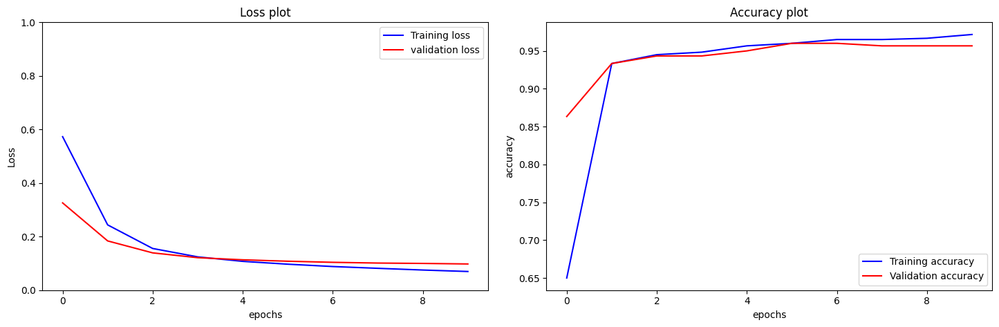

In [ ]:
acc_loss_plot(m)

10/10 [==============================] - 3s 124ms/step


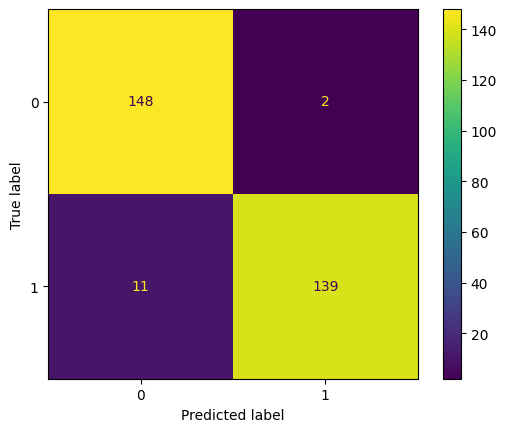

Total:  300


In [ ]:
y_pred = pred(model_linear, cv_ds)
c = confusion_plot(model_linear, y_pred, cv_ds, labels_cv)

In [ ]:
p, r = precision_recall(labels_cv, y_pred)

Precision:  [0.93081761 0.9858156 ]
Recall:  [0.98666667 0.92666667]


In [ ]:
#classification report for linear model
cr_l = classification_report(labels_cv, y_pred, target_names = ['Dogs', 'Cats'])
print(cr_l)

              precision    recall  f1-score   support

        Dogs       0.93      0.99      0.96       150
        Cats       0.99      0.93      0.96       150

    accuracy                           0.96       300
   macro avg       0.96      0.96      0.96       300
weighted avg       0.96      0.96      0.96       300



Area under the curve:  0.9566666666666667


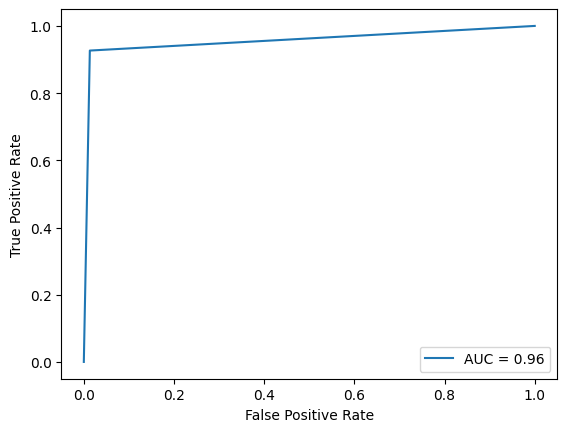

In [ ]:
roc_value = roc_plot(labels_cv, y_pred)

Evaluating on test set

In [ ]:
#evaluating on test set
model_linear.evaluate(test_ds, labels_test)

10/10 [==============================] - 1s 64ms/step - loss: 0.1496 - accuracy: 0.9400


[0.14962927997112274, 0.9399999976158142]

Resetting folders

In [ ]:
path1 = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/Gaussian"
path2 = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/Poisson"
path3 = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/Salt_Pepper"
path4 = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/mis_model_linear"
path5 = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/gaussina_noise_mis_model_linear"
path6 = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/poisson_noise_mis_model_linear"
path7 = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/sp_noise_mis_model_linear"

In [ ]:
paths = [path1, path2, path3, path4, path4, path6, path7]
reset_folders(paths)

Path does not exists: /content/drive/MyDrive/Cats_Vs_Dogs_Dataset/mis_model_linear
Path does not exists: /content/drive/MyDrive/Cats_Vs_Dogs_Dataset/poisson_noise_mis_model_linear
Path does not exists: /content/drive/MyDrive/Cats_Vs_Dogs_Dataset/sp_noise_mis_model_linear


## Identifying misclassified images

In [ ]:
#findind misclassified images in vlidation set
mis, crt, y_pred = cal_mis(model_linear, cv_ds, labels_cv)
mis

10/10 [==============================] - 1s 70ms/step
Total misclassified:  13 



[3, 10, 32, 52, 64, 119, 164, 188, 192, 194, 197, 206, 267]

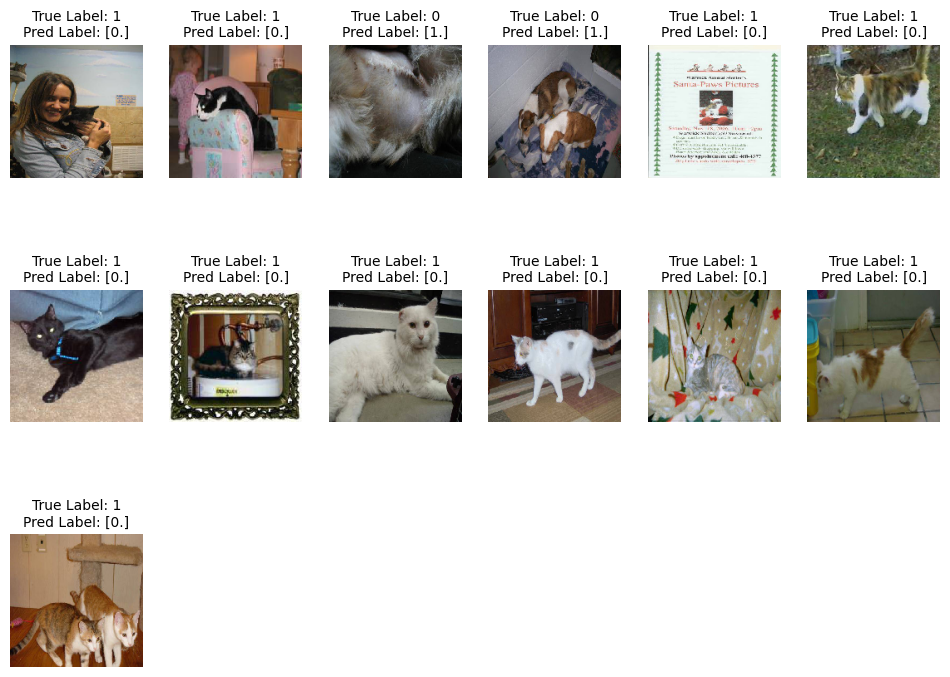

In [ ]:
#showing images that are misclassified from the validation set by the model
show_mis(mis, y_pred, cv_ds, labels_cv,[12,9], 6)

In [ ]:
#making  folder to store the misclassified images of model_linear
path = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/"
folder = "mis_model_linear"
fp = path + folder
if not os.path.exists(path + folder):
  os.mkdir(path + folder)

In [ ]:
#saving the misclassified images
save_mis(mis, cv_ds, fp)

## Testing model on images with noise applied

Applying gaussian noise

In [ ]:
#evaluating model on gaussian noise
cv_noise = add_noise(cv_ds, 'gaussian')
cv_noise_eval = model_linear.evaluate(cv_noise, labels_cv)

Applying gaussian Noise
-- gaussian noise added --
10/10 [==============================] - 1s 65ms/step - loss: 0.2205 - accuracy: 0.8867


In [ ]:
#findind misclassified images in noisy validation set
mis_noise, crt_noise, y_pred_noise = cal_mis(model_linear, cv_noise, labels_cv)
print(mis_noise)

10/10 [==============================] - 2s 68ms/step
Total misclassified:  34 

[1, 7, 10, 35, 38, 44, 61, 64, 91, 104, 106, 119, 146, 164, 174, 183, 188, 190, 192, 194, 197, 206, 212, 217, 218, 229, 236, 239, 248, 255, 257, 267, 278, 294]


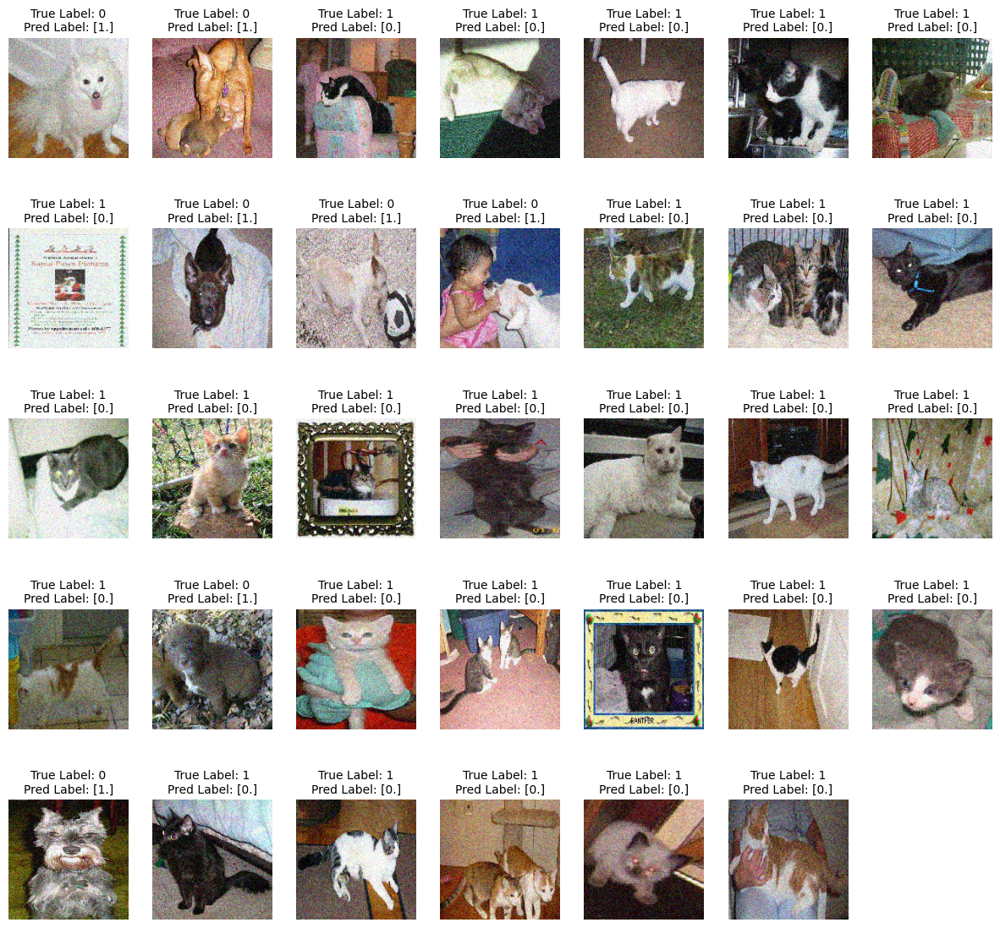

In [ ]:
# showing images that are misclassified in the noise dataset
show_mis(mis_noise, y_pred_noise, cv_noise, labels_cv, [15,20], 7)

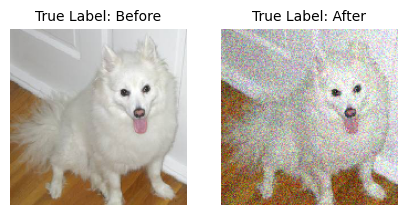

In [ ]:
show_imgs([cv_ds[mis_noise[0]], cv_noise[mis_noise[0]]], ["Before", "After"], [5,5], 2, None)

In [ ]:
# #making  folder to store the misclassified noise images of model_linear
# path = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/"
# folder = "gaussian_noise_mis_model_linear"
# fp = path + folder
# if not os.path.exists(fp):
#   os.mkdir((fp))

In [ ]:
# #saving the misclassified images after adding gaussian noise
# save_mis(mis_noise, cv_noise, fp)

Processing images after adding noise

In [ ]:
#showing which images are correctly classified which were previously misclassified, after adding gaussian noise
cca = cca_improve(mis, mis_noise)
len(cca)

3

In [ ]:
mca = mca_reduce(mis_noise, crt)
len(mca)

After adding noise:


24

In [ ]:
ccba = ccba_f(crt, crt_noise)
len(ccba)

263

In [ ]:
mcba = mcba_f(mis, mis_noise)
len(mcba)

10

In [ ]:
#making  folder to store images after gaussian noise
path = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/"
folder = "Gaussian"
folder1 = "/mcba"
folder2 = "/mca"
folder3 = "/ccba"
folder4 = "/cca"

fp = path + folder
fp1 = fp + folder1
fp2 = fp + folder2
fp3 = fp + folder3
fp4 = fp + folder4

if not os.path.exists(fp):
  os.mkdir(fp)

if not os.path.exists(fp1):
  os.mkdir(fp1)
if not os.path.exists(fp2):
  os.mkdir((fp2))
if not os.path.exists(fp3):
  os.mkdir((fp3))
if not os.path.exists(fp4):
  os.mkdir((fp4))


In [ ]:
store_imgs(cv_noise, mcba, mca, ccba, cca, fp)

Applying salt and pepper noise

In [ ]:
#creating a dataset with salt and pepper noise from validation set
#evaluation model on salt and pepper noise
cv_noise = add_noise(cv_ds, 's&p', 0.001)
cv_noise_eval = model_linear.evaluate(cv_noise, labels_cv)

Applying s&p Noise
-- s&p noise added --
10/10 [==============================] - 1s 66ms/step - loss: 0.1117 - accuracy: 0.9500


In [ ]:
#findind misclassified images in noisy validation set
mis_noise, crt_noise, y_pred_noise = cal_mis(model_linear, cv_noise, labels_cv)
print(mis_noise)

10/10 [==============================] - 1s 60ms/step
Total misclassified:  15 

[3, 10, 32, 35, 44, 52, 64, 119, 164, 188, 190, 192, 194, 197, 267]


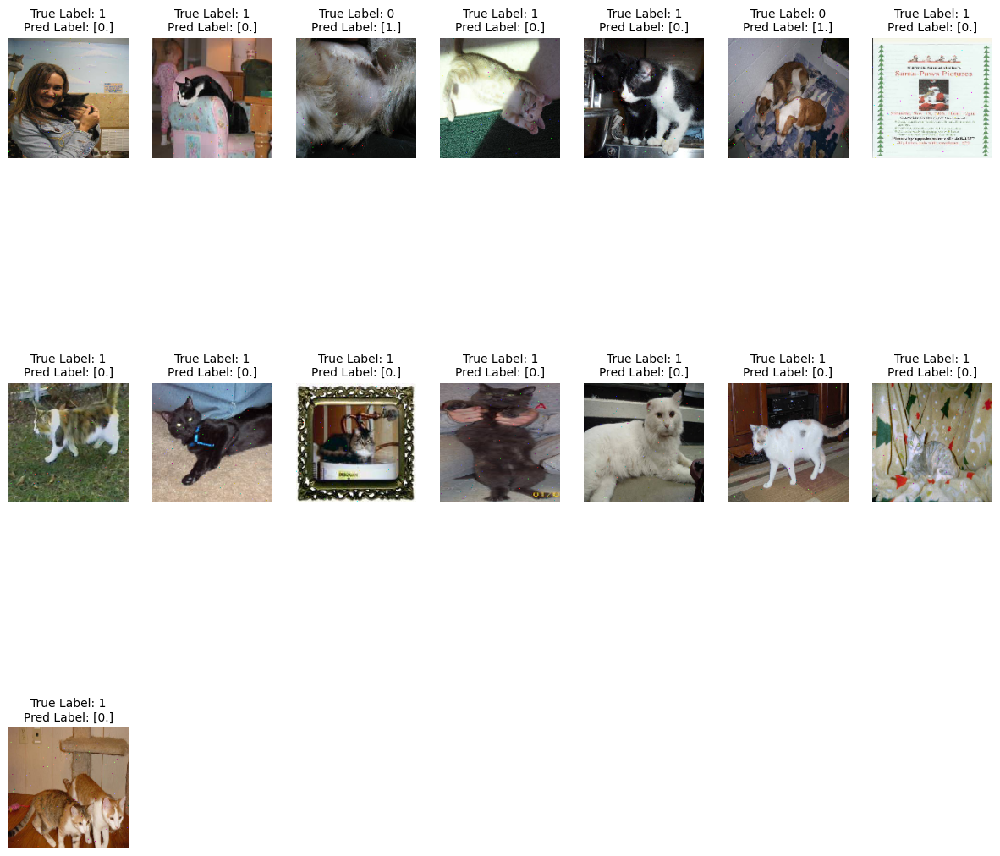

In [ ]:
#showing images that are misclassified in the noise dataset
show_mis(mis_noise, y_pred_noise, cv_noise, labels_cv, [15,15], 7)

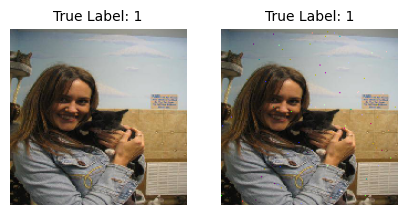

In [ ]:
show_imgs([cv_ds[mis_noise[0]], cv_noise[mis_noise[0]]], [labels_cv[mis_noise[0]], labels_cv[mis_noise[0]]], [5,5], 2, None)

In [ ]:
# #making  folder to store the misclassified noise images of model_linear
# path = "/content/drive/MyDrive/Dataset/"
# folder = "sp_noise_mis_model_linear"
# fp = path + folder
# if not os.path.exists(fp):
#   os.mkdir((fp))

In [ ]:
# #saving the misclassified images after adding salt and pepper noise
# save_mis(mis_noise, cv_noise, fp)

In [ ]:
#showing which images are correctly classified which were previously misclassified, after adding s&p noise
cca = cca_improve(mis, mis_noise)
len(cca)

1

In [ ]:
mca = mca_reduce(mis_noise, crt)
len(mca)

After adding noise:


3

In [ ]:
ccba = ccba_f(crt, crt_noise)
len(ccba)

284

In [ ]:
mcba = mcba_f(mis, mis_noise)
len(mcba)

12

In [ ]:
#making  folder to store images after s&p noise
path = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/"
folder = "Salt_Pepper"
folder1 = "/mcba"
folder2 = "/mca"
folder3 = "/ccba"
folder4 = "/cca"

fp = path + folder
fp1 = fp + folder1
fp2 = fp + folder2
fp3 = fp + folder3
fp4 = fp + folder4

if not os.path.exists(fp):
  os.mkdir(fp)

if not os.path.exists(fp1):
  os.mkdir(fp1)
if not os.path.exists(fp2):
  os.mkdir((fp2))
if not os.path.exists(fp3):
  os.mkdir((fp3))
if not os.path.exists(fp4):
  os.mkdir((fp4))


In [ ]:
store_imgs(cv_noise, mcba, mca, ccba, cca, fp)

Applying Poisson noise

In [ ]:
#creating a dataset with poisson noise from validation set
#evaluation model on poisson noise
cv_noise = add_noise(cv_ds, 'poisson')
cv_noise_eval = model_linear.evaluate(cv_noise, labels_cv)

Applying poisson Noise
-- poisson noise added --
10/10 [==============================] - 1s 66ms/step - loss: 0.1241 - accuracy: 0.9400


In [ ]:
#findind misclassified images in noisy validation set
mis_noise, crt_noise, y_pred_noise = cal_mis(model_linear, cv_noise, labels_cv)
print(mis_noise)

10/10 [==============================] - 1s 61ms/step
Total misclassified:  18 

[1, 3, 10, 35, 38, 44, 52, 64, 119, 164, 188, 190, 194, 197, 206, 217, 236, 267]


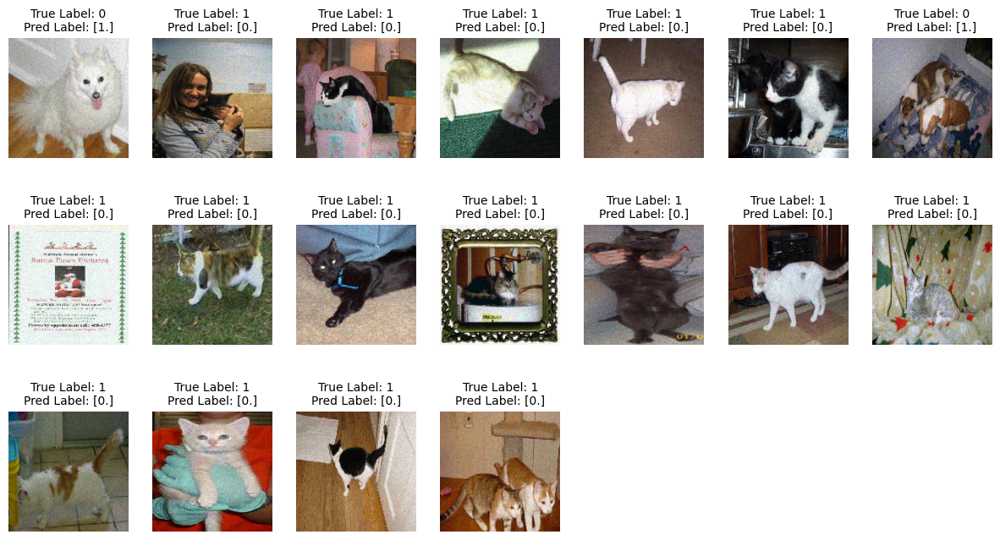

In [ ]:
#showing images that are misclassified in the noise dataset
show_mis(mis_noise, y_pred_noise, cv_noise, labels_cv, [15,11], 7)

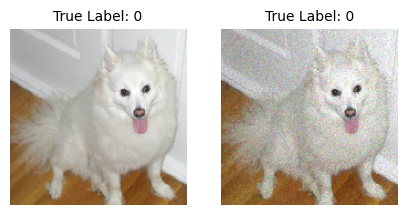

In [ ]:
show_imgs([cv_ds[mis_noise[0]], cv_noise[mis_noise[0]]], [labels_cv[mis_noise[0]], labels_cv[mis_noise[0]]], [5,5], 2, None)

In [ ]:
# #making  folder to store the misclassified noise images of model_linear
# path = "/content/drive/MyDrive/Dataset/"
# folder = "poisson_noise_mis_model_linear"
# fp = path + folder
# if not os.path.exists(fp):
#   os.mkdir((fp))

In [ ]:
# #saving the misclassified images after adding poisson
# save_mis(mis_noise, cv_noise, fp)

In [ ]:
#showing which images are correctly classified which were previously misclassified, after adding poisson noise
cca = cca_improve(mis, mis_noise)
len(cca)

2

In [ ]:
mca = mca_reduce(mis_noise, crt)
len(mca)

After adding noise:


7

In [ ]:
ccba = ccba_f(crt, crt_noise)
len(ccba)

280

In [ ]:
mcba = mcba_f(mis, mis_noise)
len(mcba)

11

In [ ]:
#making  folder to store images after poisson noise
path = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/"
folder = "Poisson"
folder1 = "/mcba"
folder2 = "/mca"
folder3 = "/ccba"
folder4 = "/cca"

fp = path + folder
fp1 = fp + folder1
fp2 = fp + folder2
fp3 = fp + folder3
fp4 = fp + folder4

if not os.path.exists(fp):
  os.mkdir(fp)

if not os.path.exists(fp1):
  os.mkdir(fp1)
if not os.path.exists(fp2):
  os.mkdir((fp2))
if not os.path.exists(fp3):
  os.mkdir((fp3))
if not os.path.exists(fp4):
  os.mkdir((fp4))


In [ ]:
store_imgs(cv_noise, mcba, mca, ccba, cca, fp)

### **Testing model on images of multiple cats and dogs and both**

In [ ]:
#getting paths of all the images from the designated folder
main_dir = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/test"
path_imgs = []

for i in listdir(main_dir):
  path_imgs.append(os.path.join(main_dir, i))

Index out of range


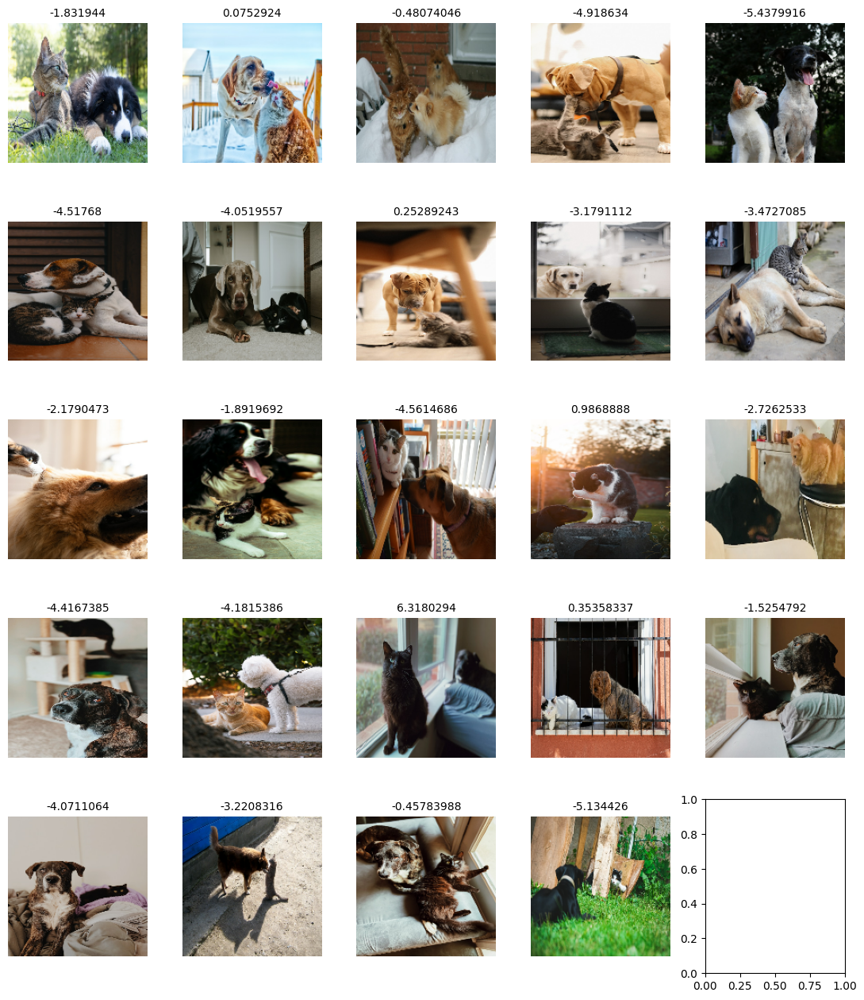

In [ ]:
#predictiong images and plotting them
try:
  img_pred(path_imgs, model_linear, [5,5], [11,12.5])
except IndexError:
  print("Index out of range")

## Checking Performance of Model on different distributions of train and validation datasets

In [ ]:
models, historys = model_on_train(train_ds, labels_train, cv_ds, labels_cv)

In [ ]:
print_train_results(historys)

m_8:[train: 800]     loss: 0.062 - accuracy: 0.974 - val_loss: 0.065 - val_accuracy: 0.99
m_7:[train: 700]     loss: 0.069 - accuracy: 0.97 - val_loss: 0.075 - val_accuracy: 0.98
m_6:[train: 600]     loss: 0.059 - accuracy: 0.982 - val_loss: 0.068 - val_accuracy: 0.97
m_5:[train: 500]     loss: 0.07 - accuracy: 0.966 - val_loss: 0.067 - val_accuracy: 0.99
m_4:[train: 400]     loss: 0.074 - accuracy: 0.967 - val_loss: 0.071 - val_accuracy: 0.99
m_3:[train: 300]     loss: 0.073 - accuracy: 0.97 - val_loss: 0.096 - val_accuracy: 0.97
m_2:[train: 200]     loss: 0.102 - accuracy: 0.97 - val_loss: 0.099 - val_accuracy: 0.98
m_1:[train: 100]     loss: 0.134 - accuracy: 0.97 - val_loss: 0.18 - val_accuracy: 0.95


In [ ]:
test_results = model_on_test(models, test_ds, labels_test)

m_8: [0.136, 0.94]
m_7: [0.135, 0.937]
m_6: [0.128, 0.943]
m_5: [0.127, 0.943]
m_4: [0.14, 0.943]
m_3: [0.143, 0.947]
m_2: [0.148, 0.947]
m_1: [0.21, 0.93]


# **Applying Adaptive Histogram Equilization**

In [ ]:
new_train = apply_ahe(train_ds)
new_test = apply_ahe(test_ds)
new_cv = apply_ahe(cv_ds)

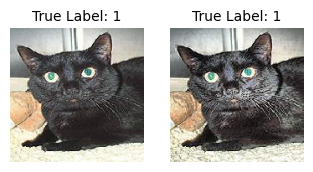

In [ ]:
show_imgs([train_ds[101], new_train[101]], [labels_train[102], labels_train[102]], [10,10], 5)

## Training model on the new ahe dataset

In [ ]:
mode_ahe = create_model(1, "linear")
mode_ahe_m = mode_ahe.fit(new_train, labels_train, validation_data = (new_cv, labels_cv), epochs = 10, batch_size = 64, callbacks = callback2)

Epoch 1/10
10/10 [==============================] - 6s 331ms/step - loss: 0.5327 - accuracy: 0.6733 - val_loss: 0.2854 - val_accuracy: 0.8967 - lr: 0.0010
Epoch 2/10
10/10 [==============================] - 2s 193ms/step - loss: 0.2249 - accuracy: 0.9267 - val_loss: 0.1666 - val_accuracy: 0.9500 - lr: 0.0010
Epoch 3/10
10/10 [==============================] - 2s 189ms/step - loss: 0.1505 - accuracy: 0.9400 - val_loss: 0.1334 - val_accuracy: 0.9567 - lr: 0.0010
Epoch 4/10
10/10 [==============================] - 2s 194ms/step - loss: 0.1248 - accuracy: 0.9483 - val_loss: 0.1198 - val_accuracy: 0.9533 - lr: 0.0010
Epoch 5/10
10/10 [==============================] - 2s 194ms/step - loss: 0.1092 - accuracy: 0.9500 - val_loss: 0.1134 - val_accuracy: 0.9567 - lr: 0.0010
Epoch 6/10
10/10 [==============================] - 2s 191ms/step - loss: 0.0980 - accuracy: 0.9567 - val_loss: 0.1103 - val_accuracy: 0.9567 - lr: 0.0010
Epoch 7/10
10/10 [==============================] - 2s 198ms/step - lo

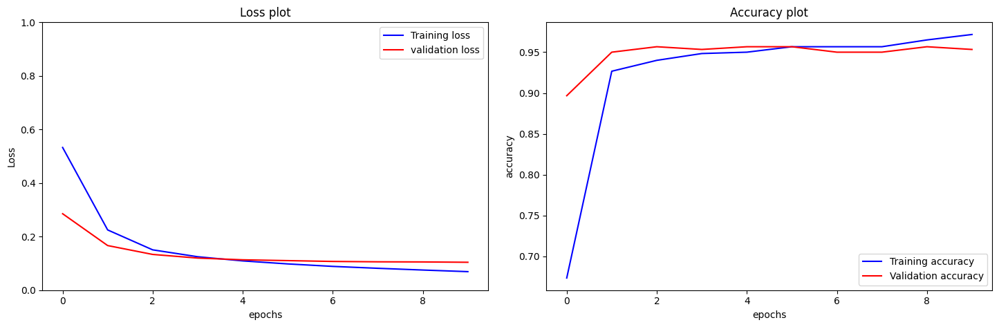

In [ ]:
acc_loss_plot(mode_ahe_m)

10/10 [==============================] - 1s 65ms/step


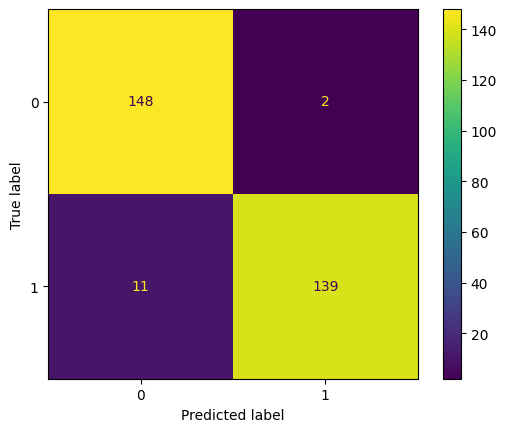

Total:  300


In [ ]:
y_pred = pred(mode_ahe, cv_ds)
c = confusion_plot(mode_ahe, y_pred, cv_ds, labels_cv)

In [ ]:
p, r = precision_recall(labels_cv, y_pred)

Precision:  [0.93081761 0.9858156 ]
Recall:  [0.98666667 0.92666667]


In [ ]:
#classification report for linear model
cr_l = classification_report(labels_cv, y_pred, target_names = ['Dogs', 'Cats'])
print(cr_l)

              precision    recall  f1-score   support

        Dogs       0.93      0.99      0.96       150
        Cats       0.99      0.93      0.96       150

    accuracy                           0.96       300
   macro avg       0.96      0.96      0.96       300
weighted avg       0.96      0.96      0.96       300



Area under the curve:  0.9566666666666667


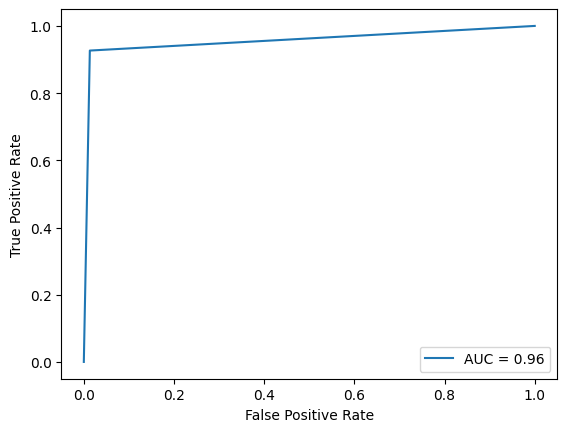

In [ ]:
roc_value = roc_plot(labels_cv, y_pred)

In [ ]:
#evaluating on test set
mode_ahe.evaluate(test_ds, labels_test)

10/10 [==============================] - 1s 66ms/step - loss: 0.1393 - accuracy: 0.9433


[0.13925395905971527, 0.9433333277702332]

Showing misclassified images in cv set

In [ ]:
#findind misclassified images in validation set
mis, crt, y_pred = cal_mis(mode_ahe, cv_ds, labels_cv)
print(mis)

10/10 [==============================] - 1s 64ms/step
Total misclassified:  13 

[3, 10, 32, 52, 64, 119, 164, 188, 192, 194, 197, 206, 267]


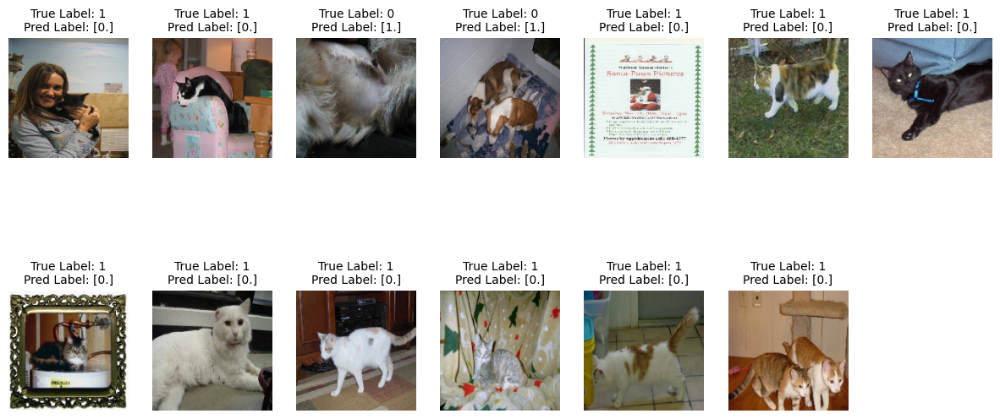

In [ ]:
#showing images that are misclassified in the validation dataset
show_mis(mis, y_pred, cv_ds, labels_cv, [15,11], 7)

## Testing new model on images with noise applied

Applying gaussian noise

In [ ]:
#evaluating model on gaussian noise
cv_noise = add_noise(cv_ds, 'gaussian')
cv_noise_eval = mode_ahe.evaluate(cv_noise, labels_cv)

Applying gaussian Noise
-- gaussian noise added --
10/10 [==============================] - 1s 74ms/step - loss: 0.2384 - accuracy: 0.8900


In [ ]:
#findind misclassified images in noisy validation set
mis_noise, crt_noise, y_pred_noise = cal_mis(mode_ahe, cv_noise, labels_cv)
print(mis_noise)

10/10 [==============================] - 1s 64ms/step
Total misclassified:  37 

[1, 3, 10, 17, 35, 38, 43, 61, 64, 73, 101, 103, 106, 119, 164, 175, 183, 188, 190, 192, 194, 197, 199, 206, 207, 217, 218, 224, 229, 236, 239, 255, 257, 267, 268, 278, 294]


In [ ]:
# showing images that are misclassified in the noise dataset
# show_mis(mis_noise, y_pred_noise, cv_noise, labels_cv, [15,20], 7)

Applying salt and pepper noise

In [ ]:
#creating a dataset with salt and pepper noise from validation set
#evaluation model on salt and pepper noise
cv_noise = add_noise(cv_ds, 's&p', 0.001)
cv_noise_eval = mode_ahe.evaluate(cv_noise, labels_cv)

Applying s&p Noise
-- s&p noise added --
10/10 [==============================] - 1s 65ms/step - loss: 0.1082 - accuracy: 0.9500


In [ ]:
#findind misclassified images in noisy validation set
mis_noise, crt_noise, y_pred_noise = cal_mis(mode_ahe, cv_noise, labels_cv)
print(mis_noise)

10/10 [==============================] - 1s 62ms/step
Total misclassified:  16 

[3, 10, 35, 44, 64, 93, 119, 164, 188, 190, 192, 194, 197, 206, 217, 267]


In [ ]:
#showing images that are misclassified in the noise dataset
# show_mis(mis_noise, y_pred_noise, cv_noise, labels_cv, [15,15], 7)

Applying Poisson noise

In [ ]:
#creating a dataset with poisson noise from validation set
#evaluation model on poisson noise
cv_noise = add_noise(cv_ds, 'poisson')
cv_noise_eval = mode_ahe.evaluate(cv_noise, labels_cv)

Applying poisson Noise
-- poisson noise added --
10/10 [==============================] - 1s 68ms/step - loss: 0.1404 - accuracy: 0.9367


In [ ]:
#findind misclassified images in noisy validation set
mis_noise, crt_noise, y_pred_noise = cal_mis(mode_ahe, cv_noise, labels_cv)
print(mis_noise)

10/10 [==============================] - 1s 62ms/step
Total misclassified:  18 

[3, 10, 32, 35, 38, 64, 106, 119, 160, 164, 188, 190, 192, 194, 197, 206, 217, 267]


In [ ]:
#showing images that are misclassified in the noise dataset
# show_mis(mis_noise, y_pred_noise, cv_noise, labels_cv, [15,11], 7)

### **Testing model on images of multiple cats and dogs and both**

In [ ]:
#getting paths of all the images from the designated folder
main_dir = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/test"
path_imgs = []

for i in listdir(main_dir):
  path_imgs.append(os.path.join(main_dir, i))

Index out of range


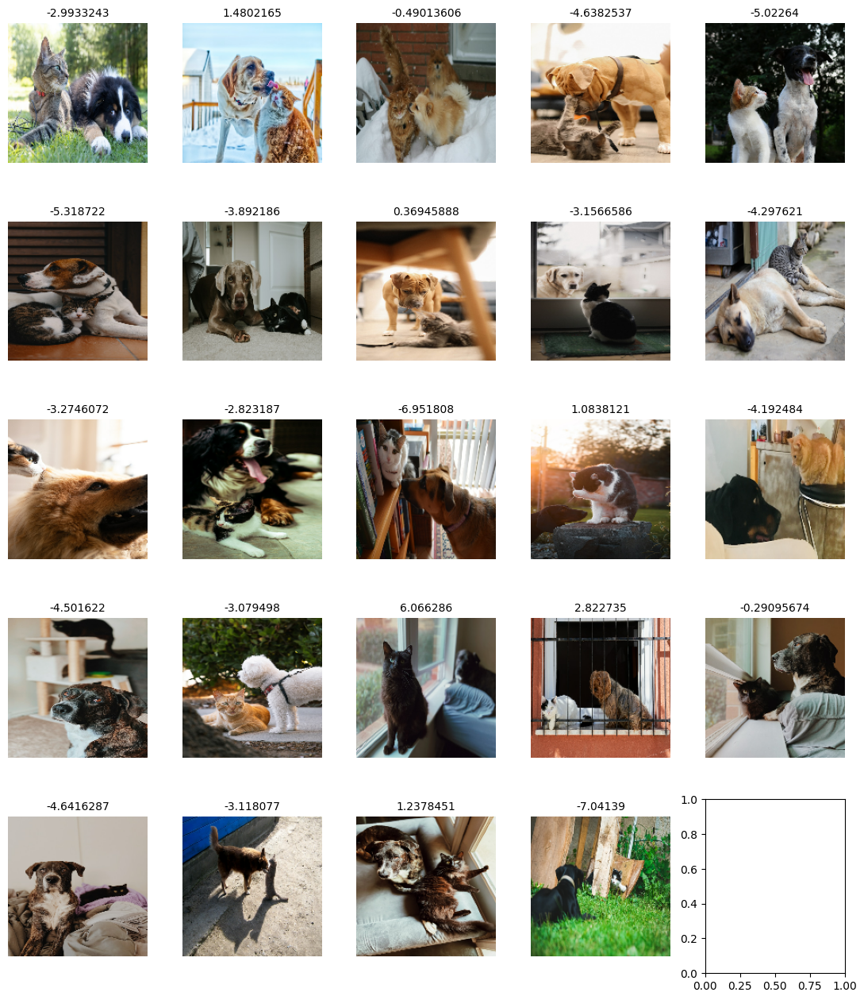

In [ ]:
#predictiong images and plotting them
try:
  img_pred(path_imgs, mode_ahe, [5,5], [11,12.5])
except IndexError:
  print("Index out of range")

## Checking Performance of Model on different distributions of train and validation datasets

In [ ]:
models, historys = model_on_train(new_train, labels_train, cv_ds, labels_cv)

In [ ]:
print_train_results(historys)

m_8:[train: 800]     loss: 0.069 - accuracy: 0.973 - val_loss: 0.064 - val_accuracy: 0.99
m_7:[train: 700]     loss: 0.066 - accuracy: 0.963 - val_loss: 0.062 - val_accuracy: 0.98
m_6:[train: 600]     loss: 0.064 - accuracy: 0.977 - val_loss: 0.056 - val_accuracy: 0.99
m_5:[train: 500]     loss: 0.072 - accuracy: 0.97 - val_loss: 0.069 - val_accuracy: 0.98
m_4:[train: 400]     loss: 0.064 - accuracy: 0.975 - val_loss: 0.065 - val_accuracy: 0.97
m_3:[train: 300]     loss: 0.079 - accuracy: 0.967 - val_loss: 0.076 - val_accuracy: 0.98
m_2:[train: 200]     loss: 0.087 - accuracy: 0.98 - val_loss: 0.105 - val_accuracy: 0.98
m_1:[train: 100]     loss: 0.105 - accuracy: 0.96 - val_loss: 0.129 - val_accuracy: 0.98


In [ ]:
test_results = model_on_test(models, test_ds, labels_test)

m_8: [0.122, 0.95]
m_7: [0.127, 0.947]
m_6: [0.133, 0.943]
m_5: [0.15, 0.937]
m_4: [0.135, 0.947]
m_3: [0.156, 0.933]
m_2: [0.158, 0.95]
m_1: [0.195, 0.927]


# GradCAM

In [ ]:
# img = cv_ds[105]
# img = tf.expand_dims(img, axis = 0)
# img, y_pred = gen_grad_img_single(grad_model, img)
# plt.imshow(img)

Creating new labels for two target classes (one hot encoding)

In [ ]:
labels_train_new = []
for i in range(len(labels_train)):
  if labels_train[i] == 0:
    labels_train_new.append([0,1])
  else:
    labels_train_new.append([1,0])

labels_train_new = np.array(labels_train_new)

In [ ]:
labels_cv_new = []
for i in range(len(labels_cv)):
  if labels_cv[i] == 0:
    labels_cv_new.append([0,1])
  else:
    labels_cv_new.append([1,0])

labels_cv_new = np.array(labels_cv_new)

Creating the model having 2 sotmax uints as ouputs, training and saving it weights

In [ ]:
nm = create_model(2, "softmax")
nm.summary()

Model: "model_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(None, 160, 160, 3)]     0         
                                                                 
 rescaling_18 (Rescaling)    (None, 160, 160, 3)       0         
                                                                 
 xception (Functional)       (None, 5, 5, 2048)        20861480  
                                                                 
 global_average_pooling2d_18  (None, 2048)             0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_18 (Dense)            (None, 2)                 4098      
                                                                 
Total params: 20,865,578
Trainable params: 4,098
Non-trainable params: 20,861,480
__________________________________________

In [ ]:
nm_m = nm.fit(train_ds, labels_train_new, validation_data = (cv_ds, labels_cv_new), epochs = 10, batch_size = 64, callbacks = callback2)

Epoch 1/10
10/10 [==============================] - 6s 288ms/step - loss: 0.5744 - accuracy: 0.7050 - val_loss: 0.2870 - val_accuracy: 0.9467 - lr: 0.0010
Epoch 2/10
10/10 [==============================] - 2s 200ms/step - loss: 0.2186 - accuracy: 0.9567 - val_loss: 0.1564 - val_accuracy: 0.9533 - lr: 0.0010
Epoch 3/10
10/10 [==============================] - 2s 203ms/step - loss: 0.1386 - accuracy: 0.9567 - val_loss: 0.1233 - val_accuracy: 0.9533 - lr: 0.0010
Epoch 4/10
10/10 [==============================] - 2s 199ms/step - loss: 0.1122 - accuracy: 0.9617 - val_loss: 0.1093 - val_accuracy: 0.9567 - lr: 0.0010
Epoch 5/10
10/10 [==============================] - 2s 199ms/step - loss: 0.0967 - accuracy: 0.9650 - val_loss: 0.1030 - val_accuracy: 0.9567 - lr: 0.0010
Epoch 6/10
10/10 [==============================] - 2s 200ms/step - loss: 0.0865 - accuracy: 0.9717 - val_loss: 0.0991 - val_accuracy: 0.9567 - lr: 0.0010
Epoch 7/10
10/10 [==============================] - 2s 200ms/step - lo

In [ ]:
weights = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/model_weights/weights_nm.h5"
nm.save_weights(weights)

# Creating gradcam model and gradcams of the given images

In [ ]:
grad_model = create_grad_model(weights, 2, "softmax")

<ipython-input-78-88d543984486>:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")



==> First image w.r.t CAT
==> Second image w.r.t DOG



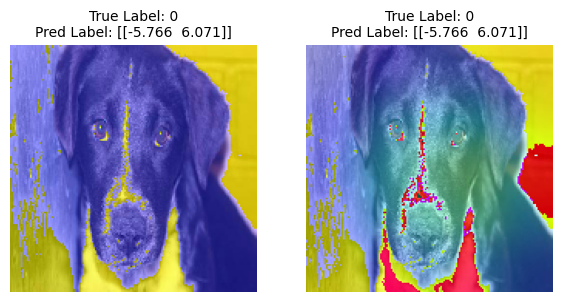

In [ ]:
gen_grad_both(grad_model, tf.expand_dims(cv_ds[4], axis = 0), labels_cv[4], [7,5], 2, font_size = 10)

<ipython-input-74-56c65ea193b3>:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")



==> First image w.r.t CAT
==> Second image w.r.t DOG



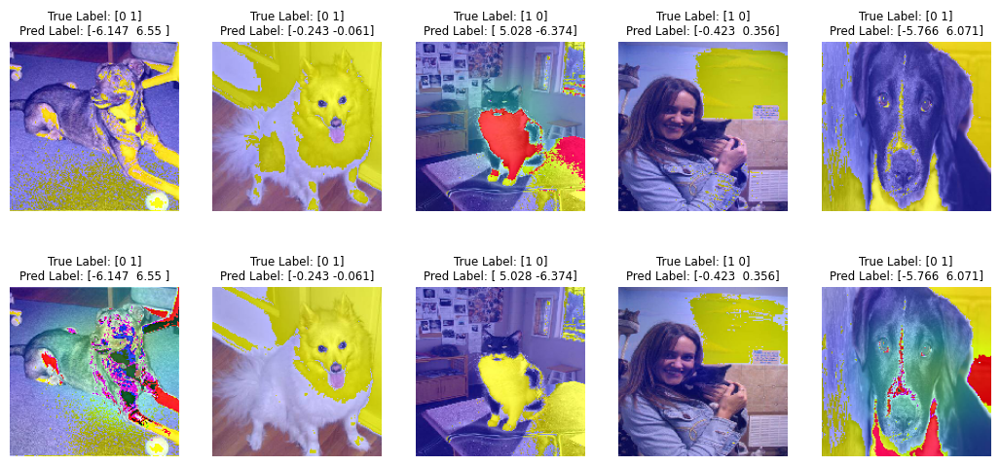

In [ ]:
gen_grad_both(grad_model, cv_ds[:5], labels_cv_new[:5], [13,6], 5, font_size = 8.5)

# **Creating new models with different pre-trained models to observe their behavior**

In [ ]:
def grad_on_model(base):
  if base == "MobileNetV2":
    base_model = keras.applications.MobileNetV2(
      # weights = "../input/xception/xception_weights_tf_dim_ordering_tf_kernels_notop.h5",
      input_shape = (160,160,3),
      include_top = False,)

  elif base == "VGG19":
    base_model = keras.applications.VGG19(
      # weights = "../input/xception/xception_weights_tf_dim_ordering_tf_kernels_notop.h5",
      input_shape = (160,160,3),
      include_top = False,)

  elif base == "ResNet50V2":
    base_model = keras.applications.ResNet50V2(
      # weights = "../input/xception/xception_weights_tf_dim_ordering_tf_kernels_notop.h5",
      input_shape = (160,160,3),
      include_top = False,)

  elif base == "Xception":
    base_model = keras.applications.Xception(
      # weights = "../input/xception/xception_weights_tf_dim_ordering_tf_kernels_notop.h5",
      input_shape = (160,160,3),
      include_top = False,)

  base_model.trainable = False

  model, inputs, x, outputs = create_model_mod_base(2, "softmax", base_model)
  model_m = model.fit(train_ds, labels_train_new, validation_data = (cv_ds, labels_cv_new), epochs = 10, batch_size = 64, callbacks = callback2)
  weights = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/model_weights/weights_model_abcefg.h5"
  model.save_weights(weights)

  grad_model = create_grad_model_base(weights, 2, "softmax", base_model)
  gen_grad_both(grad_model, cv_ds[:5], labels_cv_new[:5], [13,6], 5, font_size = 8.5)

VGG19

9406464/9406464 [==============================] - 0s 0us/step
Epoch 1/10
10/10 [==============================] - 8s 332ms/step - loss: 0.5771 - accuracy: 0.7617 - val_loss: 0.3493 - val_accuracy: 0.9333 - lr: 0.0010
Epoch 2/10
10/10 [==============================] - 1s 80ms/step - loss: 0.2807 - accuracy: 0.9383 - val_loss: 0.2037 - val_accuracy: 0.9467 - lr: 0.0010
Epoch 3/10
10/10 [==============================] - 1s 68ms/step - loss: 0.1867 - accuracy: 0.9500 - val_loss: 0.1610 - val_accuracy: 0.9633 - lr: 0.0010
Epoch 4/10
10/10 [==============================] - 1s 68ms/step - loss: 0.1491 - accuracy: 0.9567 - val_loss: 0.1425 - val_accuracy: 0.9467 - lr: 0.0010
Epoch 5/10
10/10 [==============================] - 1s 68ms/step - loss: 0.1262 - accuracy: 0.9617 - val_loss: 0.1323 - val_accuracy: 0.9633 - lr: 0.0010
Epoch 6/10
10/10 [==============================] - 1s 86ms/step - loss: 0.1114 - accuracy: 0.9683 - val_loss: 0.1255 - val_accuracy: 0.9600 - lr: 0.0010
Epoch 7/10
1

<ipython-input-74-56c65ea193b3>:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")



==> First image w.r.t CAT
==> Second image w.r.t DOG



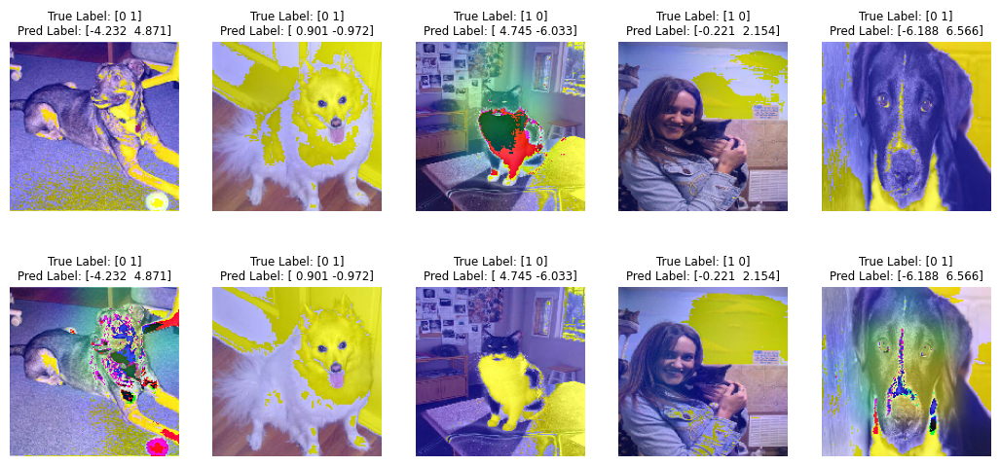

In [ ]:
grad_on_model("VGG19")

ResNet50V2

Epoch 1/10
10/10 [==============================] - 4s 183ms/step - loss: 0.5657 - accuracy: 0.7333 - val_loss: 0.3230 - val_accuracy: 0.9333 - lr: 0.0010
Epoch 2/10
10/10 [==============================] - 1s 79ms/step - loss: 0.2793 - accuracy: 0.9217 - val_loss: 0.1952 - val_accuracy: 0.9500 - lr: 0.0010
Epoch 3/10
10/10 [==============================] - 1s 68ms/step - loss: 0.1914 - accuracy: 0.9400 - val_loss: 0.1583 - val_accuracy: 0.9633 - lr: 0.0010
Epoch 4/10
10/10 [==============================] - 1s 68ms/step - loss: 0.1552 - accuracy: 0.9483 - val_loss: 0.1390 - val_accuracy: 0.9533 - lr: 0.0010
Epoch 5/10
10/10 [==============================] - 1s 68ms/step - loss: 0.1321 - accuracy: 0.9600 - val_loss: 0.1290 - val_accuracy: 0.9667 - lr: 0.0010
Epoch 6/10
10/10 [==============================] - 1s 73ms/step - loss: 0.1169 - accuracy: 0.9600 - val_loss: 0.1224 - val_accuracy: 0.9667 - lr: 0.0010
Epoch 7/10
10/10 [==============================] - 1s 88ms/step - loss: 0.

<ipython-input-74-56c65ea193b3>:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")



==> First image w.r.t CAT
==> Second image w.r.t DOG



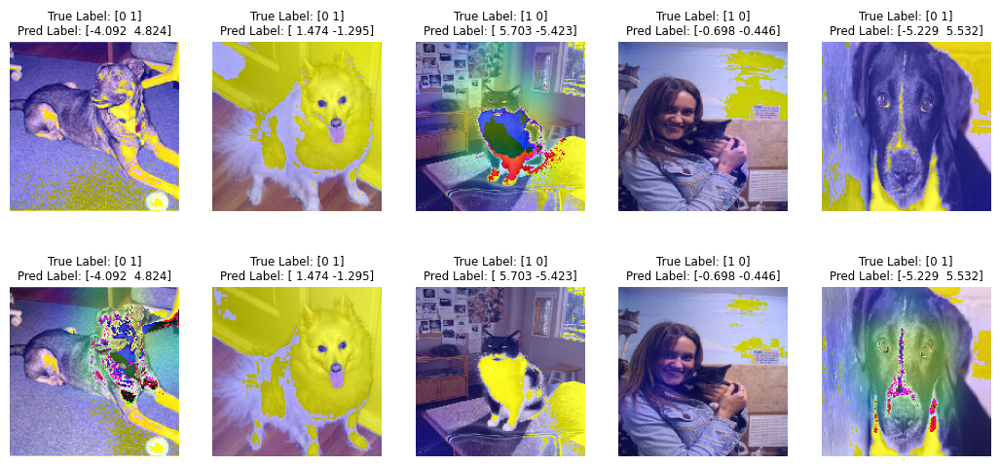

In [ ]:
grad_on_model("ResNet50V2")

Xception

Epoch 1/10
10/10 [==============================] - 4s 173ms/step - loss: 0.5450 - accuracy: 0.7633 - val_loss: 0.3415 - val_accuracy: 0.9033 - lr: 0.0010
Epoch 2/10
10/10 [==============================] - 1s 68ms/step - loss: 0.2702 - accuracy: 0.9317 - val_loss: 0.2136 - val_accuracy: 0.9267 - lr: 0.0010
Epoch 3/10
10/10 [==============================] - 1s 79ms/step - loss: 0.1843 - accuracy: 0.9433 - val_loss: 0.1787 - val_accuracy: 0.9400 - lr: 0.0010
Epoch 4/10
10/10 [==============================] - 1s 79ms/step - loss: 0.1518 - accuracy: 0.9583 - val_loss: 0.1569 - val_accuracy: 0.9400 - lr: 0.0010
Epoch 5/10
10/10 [==============================] - 1s 86ms/step - loss: 0.1294 - accuracy: 0.9583 - val_loss: 0.1478 - val_accuracy: 0.9433 - lr: 0.0010
Epoch 6/10
10/10 [==============================] - 1s 84ms/step - loss: 0.1148 - accuracy: 0.9617 - val_loss: 0.1402 - val_accuracy: 0.9467 - lr: 0.0010
Epoch 7/10
10/10 [==============================] - 1s 82ms/step - loss: 0.

<ipython-input-74-56c65ea193b3>:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")



==> First image w.r.t CAT
==> Second image w.r.t DOG



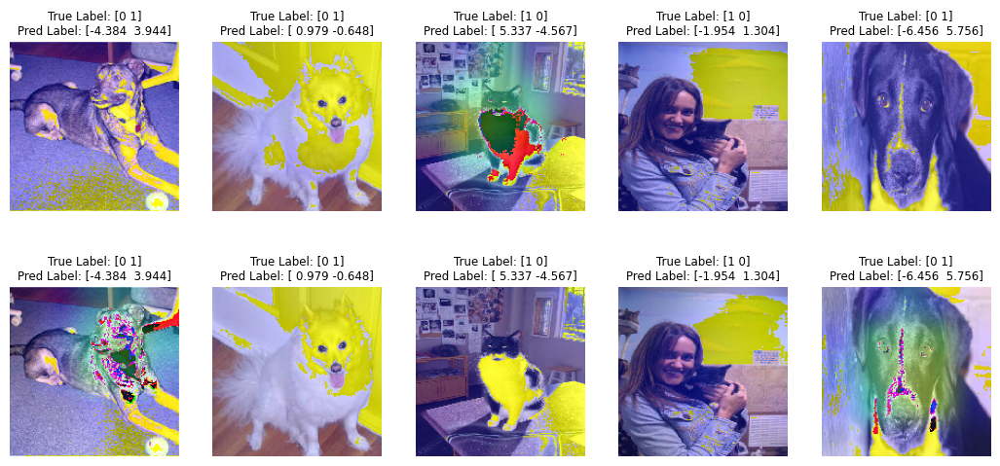

In [ ]:
grad_on_model("Xception")

MobileNetV2

Epoch 1/10
10/10 [==============================] - 7s 227ms/step - loss: 0.5215 - accuracy: 0.8250 - val_loss: 0.3297 - val_accuracy: 0.9300 - lr: 0.0010
Epoch 2/10
10/10 [==============================] - 1s 69ms/step - loss: 0.2660 - accuracy: 0.9383 - val_loss: 0.2079 - val_accuracy: 0.9567 - lr: 0.0010
Epoch 3/10
10/10 [==============================] - 1s 80ms/step - loss: 0.1858 - accuracy: 0.9500 - val_loss: 0.1699 - val_accuracy: 0.9467 - lr: 0.0010
Epoch 4/10
10/10 [==============================] - 1s 68ms/step - loss: 0.1532 - accuracy: 0.9517 - val_loss: 0.1514 - val_accuracy: 0.9600 - lr: 0.0010
Epoch 5/10
10/10 [==============================] - 1s 80ms/step - loss: 0.1303 - accuracy: 0.9567 - val_loss: 0.1400 - val_accuracy: 0.9567 - lr: 0.0010
Epoch 6/10
10/10 [==============================] - 1s 70ms/step - loss: 0.1166 - accuracy: 0.9633 - val_loss: 0.1324 - val_accuracy: 0.9600 - lr: 0.0010
Epoch 7/10
10/10 [==============================] - 1s 68ms/step - loss: 0.

<ipython-input-74-56c65ea193b3>:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")



==> First image w.r.t CAT
==> Second image w.r.t DOG



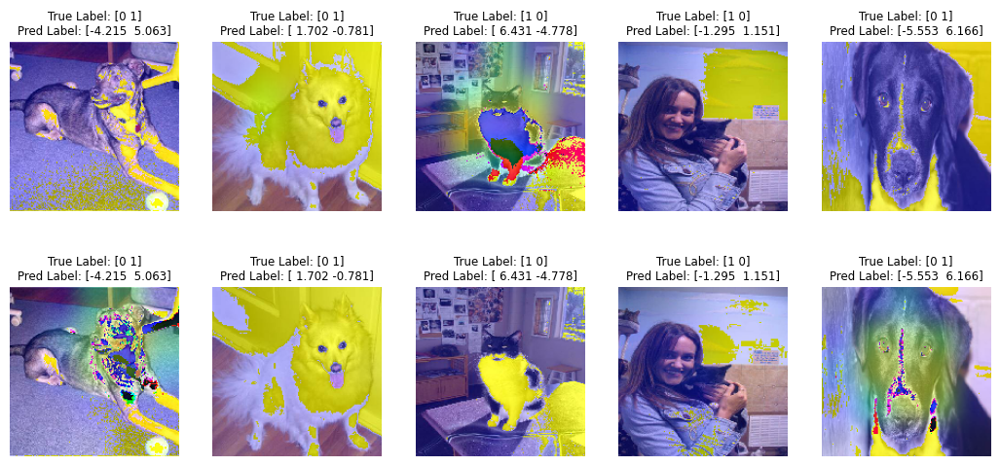

In [ ]:
grad_on_model("MobileNetV2")

## **Fine Tuning**

In [ ]:
def fine_tune(model, base_model, weights, freeze_layers_start, train_ds, labels_train_new, cv_ds, labels_cv_new, verbose = 0):

  freeze = freeze_layers_start
  freeze = freeze - 5
  historys = []

  while(True):
    freeze = freeze + 5
    print("Layers freezed: " + str(freeze))

    base_model.trainable = False
    model.load_weights(weights)

    #setting the base model to be tarinable and then freezing the initial layers
    base_model.trainable = True
    for layer in base_model.layers[:freeze]:
        layer.trainable = False

    #fine tuning by using a very small learning rate
    model.compile(
        loss = keras.losses.BinaryCrossentropy(),
        optimizer = keras.optimizers.Adam(1e-5),
        metrics = ["accuracy"]
    )

    model_m = model.fit(train_ds, labels_train_new, validation_data = (cv_ds, labels_cv_new),
                                  epochs = 10, batch_size = 64, callbacks = callback2, verbose = verbose)

    print("loss: " + str(round(model_m.history['loss'][-1], 4)), end = " - ")
    print("accuracy: " + str(round(model_m.history['accuracy'][-1], 4)), end = " - ")
    print("val_loss: " + str(round(model_m.history['val_loss'][-1], 4)), end = " - ")
    print("val_accuracy: " + str(round(model_m.history['val_accuracy'][-1], 4)))

    historys.append(model_m)

    if(freeze == 130):
      break

  return historys

In [ ]:
#base model
base_model = keras.applications.Xception(
  # weights = "../input/xception/xception_weights_tf_dim_ordering_tf_kernels_notop.h5",
  input_shape = (160,160,3),
  include_top = False,)
base_model.trainable = False

In [ ]:
#creatig model to be tuned
model = create_model(2, "softmax")

In [ ]:
historys = fine_tune(model, base_model, weights, 90, train_ds, labels_train_new, cv_ds, labels_cv_new)

Layers freezed: 90
loss: 0.0135 - accuracy: 0.9983 - val_loss: 0.0785 - val_accuracy: 0.9633
Layers freezed: 95
loss: 0.0154 - accuracy: 0.9983 - val_loss: 0.0788 - val_accuracy: 0.9633
Layers freezed: 100
loss: 0.0169 - accuracy: 0.9983 - val_loss: 0.0789 - val_accuracy: 0.96
Layers freezed: 105
loss: 0.0116 - accuracy: 1.0 - val_loss: 0.0805 - val_accuracy: 0.9633
Layers freezed: 110
loss: 0.0139 - accuracy: 1.0 - val_loss: 0.0812 - val_accuracy: 0.96
Layers freezed: 115
loss: 0.0184 - accuracy: 0.9983 - val_loss: 0.0816 - val_accuracy: 0.96
Layers freezed: 120
loss: 0.0217 - accuracy: 0.9983 - val_loss: 0.0817 - val_accuracy: 0.9567
Layers freezed: 125
loss: 0.0214 - accuracy: 0.9983 - val_loss: 0.081 - val_accuracy: 0.9633
Layers freezed: 130
loss: 0.0573 - accuracy: 0.985 - val_loss: 0.0911 - val_accuracy: 0.9633


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

# Display
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm


In [ ]:
model_builder = keras.applications.xception.Xception
img_size = (299, 299)
preprocess_input = keras.applications.xception.preprocess_input
decode_predictions = keras.applications.xception.decode_predictions

last_conv_layer_name = "block14_sepconv2_act"

# The local path to our target image
img_path = "/content/drive/MyDrive/Cats_Vs_Dogs_Dataset/test/caty.jpg"

# display(Image(img_path))


In [ ]:

def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()


In [ ]:
a = get_img_array(img_path, size=img_size)
a.shape

(1, 299, 299, 3)

In [ ]:
# a

In [ ]:
# Prepare image
img_array = preprocess_input(a)
img_array.dtype

dtype('float32')

In [ ]:
img_array.shape

(1, 299, 299, 3)

In [ ]:
# img_array

1/1 [==============================] - 1s 721ms/step
Predicted: [('n02124075', 'Egyptian_cat', 7.565583)]
HEATMAP:  (10, 10)
HEATMAP:  float32


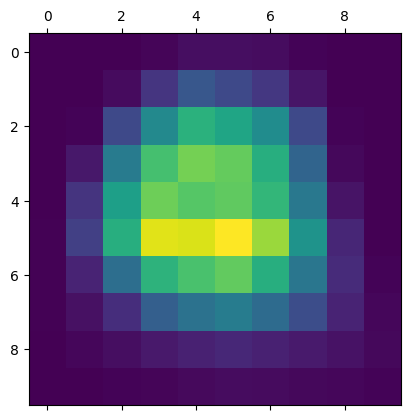

In [ ]:
# # Prepare image
# img_array = preprocess_input(get_img_array(img_path, size=img_size))

# Make model
model = model_builder(weights="imagenet")

# Remove last layer's softmax
model.layers[-1].activation = None

# Print what the top predicted class is
preds = model.predict(img_array)
print("Predicted:", decode_predictions(preds, top=1)[0])

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

print("HEATMAP: ", heatmap.shape)
print("HEATMAP: ", heatmap.dtype)

# Display heatmap
plt.matshow(heatmap)
plt.show()


<ipython-input-135-8a3df7f2985d>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


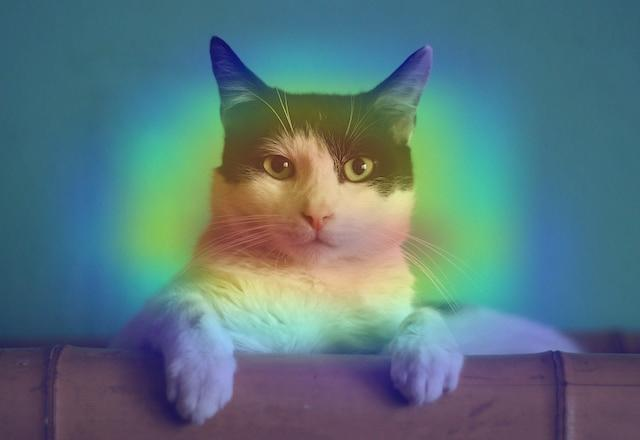

In [ ]:

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


save_and_display_gradcam(img_path, heatmap)